In [1]:
using LinearAlgebra
using QAOALandscapes
using Plots
using JLD2
using Random
using Graphs
using SimpleWeightedGraphs
using LoopVectorization
using LaTeXStrings

In [134]:
using Ripserer
using PersistenceDiagrams

As you asked, it is ideal to zoom in properly in the barcodes. The issue is that the ylim factor is setted up automatically by the `PersistenceDiagrams.jl` package.
So I had to go in the source code and try to crack it somehow. I created a function for you that given a (vector of) Persistence Diagram it return the corresponding ylims used by the backend

In [103]:
function get_ylims(diag)
    bc = PersistenceDiagrams.Barcode(diag)
    diags = bc.diags
    
    t_lo, t_hi, infinity = PersistenceDiagrams.limits(diags)
    _bar_offset = 0
    #bar_offset = RecipesBase.plotattributes[:_bar_offset]
    n_intervals = mapreduce(length, +, diags; init=0) + _bar_offset
    ylims = (1 - n_intervals * 0.05, n_intervals * 1.05)
    return ylims
end

get_ylims (generic function with 1 method)

In [3]:
# You shouldn't do this. If you do it the labels of the persistence diagrams are gonna get messed up
# I had to overwrite the PersistenceDiagrams.jl package for nice plotting
default(fontfamily="Computer Modern", framestyle=:box, grid=true, tickfontsize=10, guidefont=12, legendfontsize=12)

In [4]:
# Do this instead
# default(framestyle=:box, grid=true, tickfontsize=10, guidefont=12, legendfontsize=12)

In [5]:
# This gives the total of points per dimension given the maximum number of points in the grid
points_per_p(p::Int, npoints::Int) = floor(exp(log(npoints)/2p)) |> Int

points_per_p (generic function with 1 method)

# First get the data

## 3-regular random graph

In [6]:
dir = "../data"

"../data"

In [7]:
function load_graph_data(dir::String, N::Int)
    keyG   = "graph_list"
    fileG  = dir*"/unique_graphs_N_"*string(N)*".jld2"
    return jldopen(fileG)[keyG]
end

load_graph_data (generic function with 1 method)

In [8]:
n    = 10
d    = 3  # for 3-regular random graphs
g    = load_graph_data(dir, n)[1];

In [9]:
# N = 10 example
qaoa = QAOA(g, applySymmetries=true)

QAOA object with: 
    number of qubits = 9, and
    graph = SimpleGraph{Int64}(15, [[5, 6, 7], [3, 4, 10], [2, 5, 8], [2, 6, 10], [1, 3, 9], [1, 4, 7], [1, 6, 8], [3, 7, 9], [5, 8, 10], [2, 4, 9]])

In [10]:
# N = 14 example. Harvard graph
g_harv = harvardGraph
qaoa_harv = QAOA(g_harv, applySymmetries=true)

QAOA object with: 
    number of qubits = 13, and
    graph = {14, 21} undirected simple Int64 graph with Float64 weights

In [11]:
# this just gets the optimal point at p=1 to start the optimization procedure
initial_grid, init_point, init_energy = getInitialParameter(qaoa, spacing = 0.01); 

Convergence reached. Energy = -5.1566355197303295, |∇E| = 3.0727897914134894e-12


In [12]:
initial_grid_harv, init_point_harv, init_energy_harv = getInitialParameter(qaoa_harv, spacing=0.01);

Convergence reached. Energy = -4.4649525707138, |∇E| = 1.3299571068890784e-11


In [13]:
# I'm using INTERP. For small p it does not matter which protocol we use
interpTest = interpOptimize(qaoa, init_point, 6);

Circuit depth 	 | Energy 	 | gradient norm 
p=1 	 | -5.1566355 	 | 3.0727897914134894e-12
p=2 	 | -6.8285092 	 | 1.5149874168387464e-7
p=3 	 | -7.835448 	 | 2.3512818830864166e-7
p=4 	 | -8.8021856 	 | 4.070625772183294e-8
p=5 	 | -9.6736474 	 | 1.5150600188686868e-7
p=6 	 | -10.2415352 	 | 3.195316403426412e-9


In [14]:
interpTest_harv = interpOptimize(qaoa_harv, init_point_harv, 6);

Circuit depth 	 | Energy 	 | gradient norm 
p=1 	 | -4.4649526 	 | 1.3299571068890784e-11
p=2 	 | -5.7829856 	 | 2.84270746993048e-9
p=3 	 | -6.5704447 	 | 3.965603132192169e-8
p=4 	 | -7.0336222 	 | 2.974710201793273e-11
p=5 	 | -7.334682 	 | 9.802779367624296e-9
p=6 	 | -7.5026628 	 | 4.978122867971663e-7


### PH for QAOA @ p=1 

First we will generate the full grid at p=1 so that we can see how PH is able to fully capture all the topological features of the landscape

In [15]:
function generate_full_grid_p_1(qaoa::QAOA, npoints_per_dim::Int)
    n = nv(qaoa.graph)
    γ1 = LinRange(-π, π, npoints_per_dim)
    β1 = LinRange(-π, π, npoints_per_dim)
    
    energy_mat = zeros(npoints_per_dim, npoints_per_dim)
    Threads.@threads for j in eachindex(β1)
        for i in eachindex(γ1)
            energy_mat[i, j] = qaoa([γ1[i], β1[j]])
        end
    end
    return energy_mat
end

generate_full_grid_p_1 (generic function with 1 method)

In [16]:
npoints_p_1 = 300;

In [17]:
γ1_vals = LinRange(-π, π, npoints_p_1);

In [18]:
energ_p_1_full = generate_full_grid_p_1(qaoa, npoints_p_1);
points_mat = collect(Iterators.product(γ1_vals, γ1_vals)); 

In [19]:
energ_p_1_full_harv = generate_full_grid_p_1(qaoa_harv, npoints_p_1);

To see which minimum each interval corresponds to, we compute representatives by setting `reps=true`.

In [20]:
rips_p_1_harv = ripserer(Cubical(energ_p_1_full_harv), reps=true)

2-element Vector{PersistenceDiagram}:
 132-element 0-dimensional PersistenceDiagram
 16-element 1-dimensional PersistenceDiagram

In [21]:
rips_p_1 = ripserer(Cubical(energ_p_1_full), reps=true)

2-element Vector{PersistenceDiagram}:
 201-element 0-dimensional PersistenceDiagram
 32-element 1-dimensional PersistenceDiagram

In [22]:
min_indices = [only(birth_simplex(int)) for int in sort(rips_p_1[1]; by=birth)[1:32]];
γidx = getindex.(min_indices, 1)
βidx = getindex.(min_indices, 2);

min_indices_harv = [only(birth_simplex(int)) for int in sort(rips_p_1_harv[1]; by=birth)[1:32]];
γidx_harv = getindex.(min_indices_harv, 1)
βidx_harv = getindex.(min_indices_harv, 2);

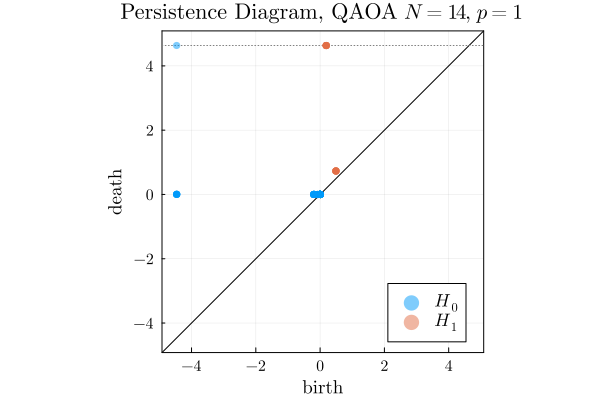

In [23]:
plot_p_1_full_perdiag_harv = Plots.plot(rips_p_1_harv, title="Persistence Diagram, QAOA "*L"N=14, p=1")

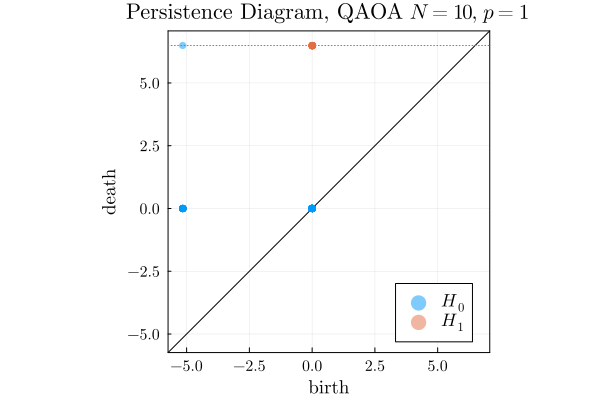

In [24]:
plot_p_1_full_perdiag = Plots.plot(rips_p_1, title="Persistence Diagram, QAOA "*L"N=10, p=1")
#Plots.savefig(plot_p_1_full_perdiag, pwd()*"/pers_diag_p_1_full_N_10.pdf")

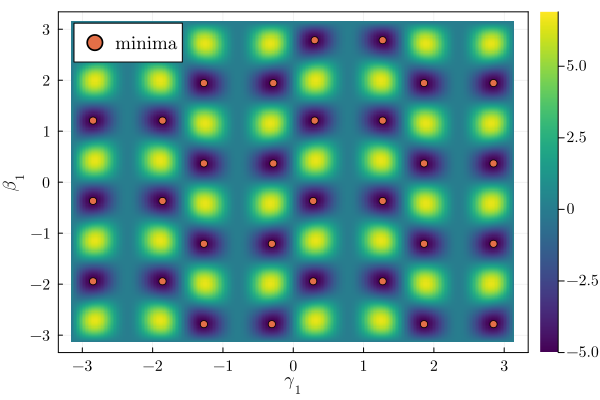

In [25]:
plot_p_1_full = Plots.heatmap(γ1_vals, γ1_vals, energ_p_1_full', c = :viridis, clims=(-5, 6.9))
Plots.plot!(plot_p_1_full, xlabel=L"\gamma_1", ylabel=L"\beta_1")
Plots.scatter!(plot_p_1_full, γ1_vals[γidx], γ1_vals[βidx], label="minima")
#[Plots.plot!(plot_p_1_full, points_mat[birth_simplex(rips_res[2][i])], m=:true, c=:black, label=nothing) for i in 1:32]
#Plots.savefig(plot_p_1_full, pwd()*"/energy_p_1_full_N_10.pdf")

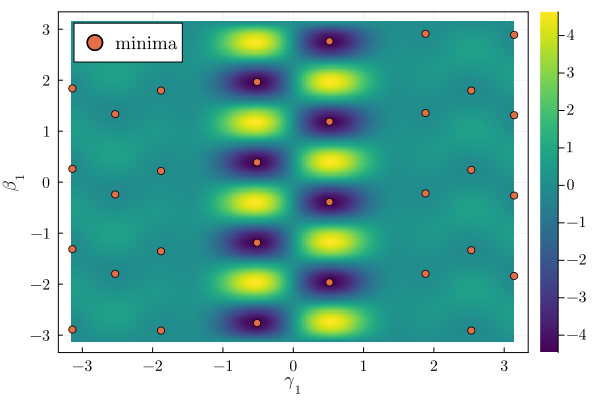

In [26]:
plot_p_1_full_harv = Plots.heatmap(γ1_vals, γ1_vals, energ_p_1_full_harv', c = :viridis)
Plots.plot!(plot_p_1_full_harv, xlabel=L"\gamma_1", ylabel=L"\beta_1")
Plots.scatter!(plot_p_1_full_harv, γ1_vals[γidx_harv], γ1_vals[βidx_harv], label="minima")
#Plots.savefig(plot_p_1_full_harv, pwd()*"/energy_p_1_full_N_14_harv.pdf")

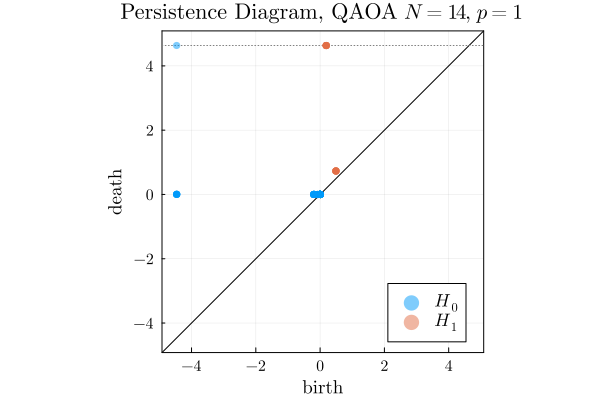

In [27]:
plot_p_1_full_perdiag_harv = plot(rips_p_1_harv, legend=:bottomright, title="Persistence Diagram, QAOA "*L"N=14, p=1")
#Plots.savefig(plot_p_1_full_perdiag_harv, pwd()*"/pers_diag_p_1_full_N_14_harv.pdf")

### PH for QAOA @ p = 2-3

Since it takes some time to compute the 4 million points grid I created a data set will all the things you should in principle need to reproduce the results

In [28]:
NPOINTS=4_000_000;

In [29]:
function generate_grid(npoints_per_dim::Int, p::Int)
    r1 = LinRange(0, π/4, npoints_per_dim)  # Range for the first dimension
    r2 = LinRange(-π/4, π/4, npoints_per_dim)  # Range for the remaining dimensions
    grid = collect(Iterators.product(r1, fill(r2, 2*p-1)...)) 
    return grid
end

function energy_grid(qaoa::QAOA, points_grid)
    energ_grid = zeros(size(points_grid))
    Threads.@threads for i in eachindex(points_grid)
        energ_grid[i] = qaoa(points_grid[i] |> collect)
    end
    return energ_grid
end

energy_grid (generic function with 1 method)

In [30]:
grid_p_3 = generate_grid(points_per_p(3, NPOINTS), 3);
grid_p_2 = generate_grid(points_per_p(2, NPOINTS), 2);

In [31]:
example_N_10 = jldopen(dir*"/data_N_10.jld2")["data_N_10"]

Dict{Any, Any} with 6 entries:
  "energ, p=3" => [2.0 2.0 … 2.0 2.0; 1.88173 1.89667 … 1.912 1.88173; … ; 0.03…
  "energ, p=2" => [2.77556e-17 6.10623e-16 … -1.11022e-15 8.32667e-17; 0.008010…
  "rips, p=2"  => PersistenceDiagram[461-element 0-dimensional PersistenceDiagr…
  "graph"      => {14, 21} undirected simple Int64 graph with Float64 weights
  "rips, p=3"  => PersistenceDiagram[4016-element 0-dimensional PersistenceDiag…
  "rips, p=1"  => PersistenceDiagram[201-element 0-dimensional PersistenceDiagr…

In [32]:
example_N_14 = jldopen(dir*"/data_N_14.jld2")["data_N_14"]

Dict{Any, Any} with 6 entries:
  "energ, p=3" => [0.26681 0.26681 … 0.26681 0.26681; 0.133257 0.14434 … 0.1616…
  "energ, p=2" => [0.257383 0.257383 … 0.257383 0.257383; 0.262051 0.268283 … 0…
  "rips, p=2"  => PersistenceDiagram[94-element 0-dimensional PersistenceDiagra…
  "graph"      => {14, 21} undirected simple Int64 graph with Float64 weights
  "rips, p=3"  => PersistenceDiagram[1866-element 0-dimensional PersistenceDiag…
  "rips, p=1"  => PersistenceDiagram[132-element 0-dimensional PersistenceDiagr…

In [42]:
# rips_p_2 = ripserer(Cubical(egrid_p_2));
rips_p_2 = example_N_10["rips, p=2"]
rips_p_3 = example_N_10["rips, p=3"]

rips_p_2_harv = example_N_14["rips, p=2"]
rips_p_3_harv = example_N_14["rips, p=3"]

2-element Vector{PersistenceDiagram}:
 1866-element 0-dimensional PersistenceDiagram
 6902-element 1-dimensional PersistenceDiagram

In [43]:
# data_N_10 = Dict()
# data_N_10["graph"] = harvardGraph;
# data_N_10["energ, p=2"] = egrid_p_2
# data_N_10["energ, p=3"] = egrid_p_3
# data_N_10["rips, p=1"] = rips_p_1
# data_N_10["rips, p=2"] = rips_p_2
# data_N_10["rips, p=3"] = rips_p_3;

In [44]:
# data_N_14 = Dict()
# data_N_14["graph"] = harvardGraph;
# data_N_14["energ, p=2"] = egrid_p_2_harv
# data_N_14["energ, p=3"] = egrid_p_3_harv;
# data_N_14["rips, p=1"] = rips_p_1_harv
# data_N_14["rips, p=2"] = rips_p_2_harv
# data_N_14["rips, p=3"] = rips_p_3_harv;

In [45]:
# example_N_10 = Dict()
# example_N_10["graph"] = g;
# example_N_10["rips, p=1"] = rips_res
# example_N_10["rips, p=2"] = rips_p_2
# example_N_10["rips, p=2"] = rips_p_3
# example_N_10["energ, p=2"] = egrid_p_2
# example_N_10["energ, p=3"] = egrid_p_3;

In [46]:
# jldsave(dir*"/data_N_10.jld2"; data_N_10)
# jldsave(dir*"/data_N_14.jld2"; data_N_14)

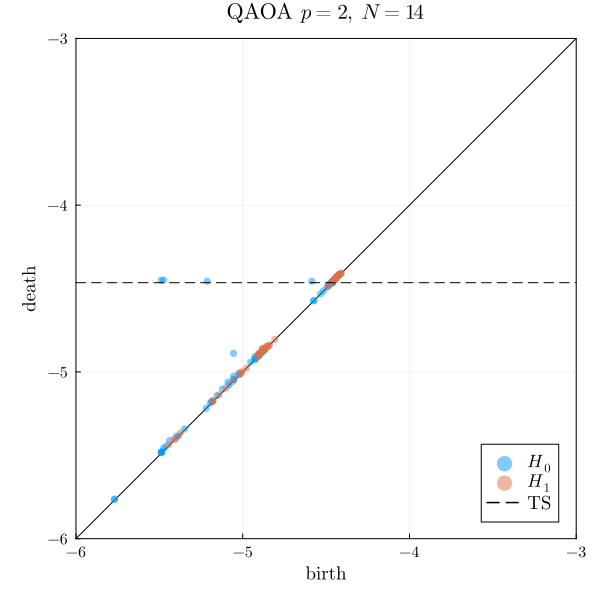

In [47]:
plot(rips_p_2_harv, size=(600, 600), xlim=(-6, -3), ylim=(-6, -3), title="QAOA "*L"p=2, \;N=14")
Plots.hline!([interpTest_harv[1][1]], ls=:dash, color=:black, label="TS")

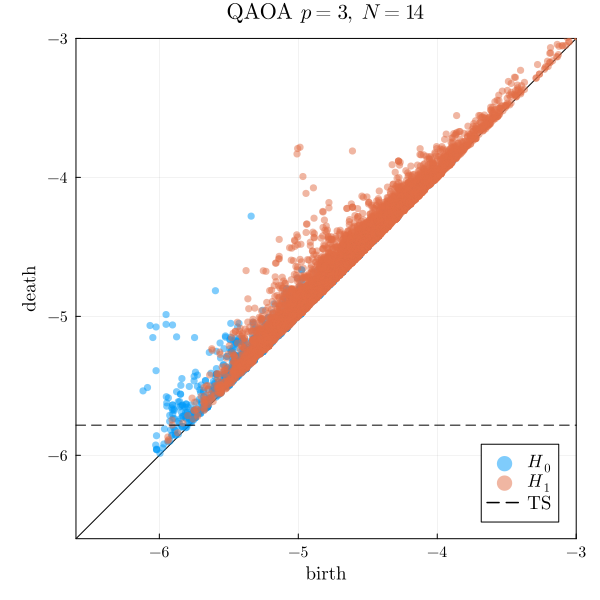

In [48]:
plot(rips_p_3_harv, size=(600, 600), xlim=(-6.6, -3), ylim=(-6.6, -3), title="QAOA "*L"p=3, \;N=14")
Plots.hline!([interpTest_harv[2][1]], ls=:dash, color=:black, label="TS")

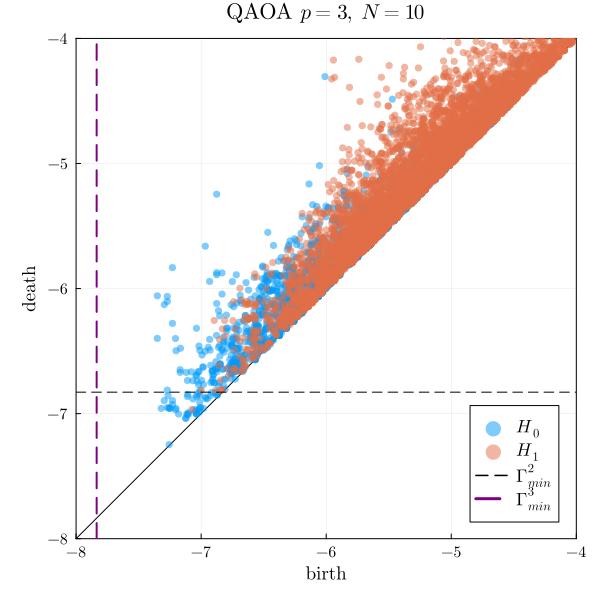

In [49]:
plot(rips_p_3, size=(600, 600), xlim=(-8, -4), ylim=(-8, -4), title="QAOA "*L"p=3, \;N=10")
Plots.hline!([interpTest[2][1]], ls=:dash, color=:black, label=latexstring("Γ^{2}_{min}"))
Plots.vline!([interpTest[3][1]], ls=:dash, color=:purple, lw=2, label = latexstring("Γ^{3}_{min}"))
#Plots.savefig(pwd()*"/ph_N_10_p_3.pdf")

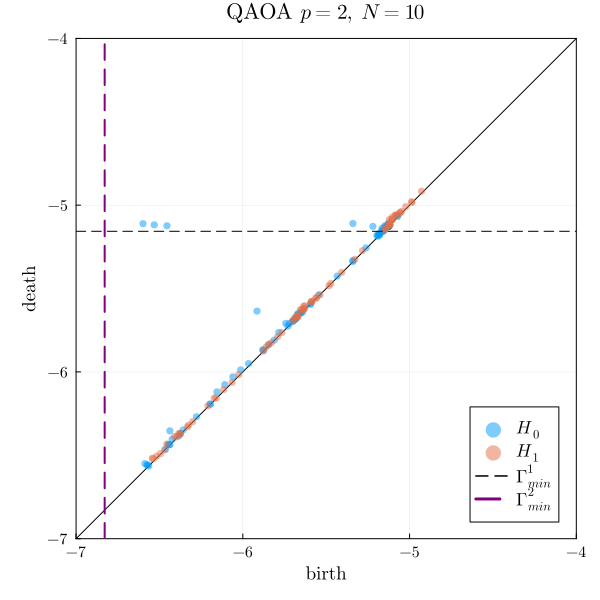

In [50]:
plot(rips_p_2, size=(600, 600), xlim=(-7, -4), ylim=(-7, -4), title="QAOA "*L"p=2, \;N=10")
Plots.hline!([interpTest[1][1]], ls=:dash, color=:black, label = latexstring("Γ^{1}_{min}"))
Plots.vline!([interpTest[2][1]], ls=:dash, color=:purple, lw=2, label = latexstring("Γ^{2}_{min}"))
#Plots.savefig(pwd()*"/ph_N_10_p_2.pdf")

Here I'm only showing the $H_0$ component

┌ Info: ylims :=
└   (1 - n_intervals * 0.05, n_intervals * 1.05) = (-3.7, 98.7)


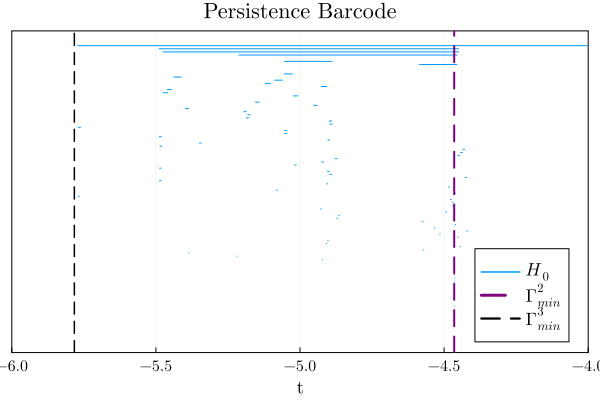

In [104]:
barcode(rips_p_2_harv[1], xlim=(-6, -4), lw=1, size=(600, 400), legend=:bottomright)
Plots.vline!([interpTest_harv[1][1]], ls=:dash, color=:purple, lw=2, label = latexstring("Γ^{2}_{min}"))
Plots.vline!([interpTest_harv[2][1]], ls=:dash, color=:black, lw=1.5, label = latexstring("Γ^{3}_{min}"))
#Plots.savefig(pwd()*"/pb_N_14_p_2.pdf")

In [116]:
get_ylims(rips_p_2[1])

(-22.05, 484.05)

┌ Info: ylims :=
└   (1 - n_intervals * 0.05, n_intervals * 1.05) = (-22.05, 484.05)


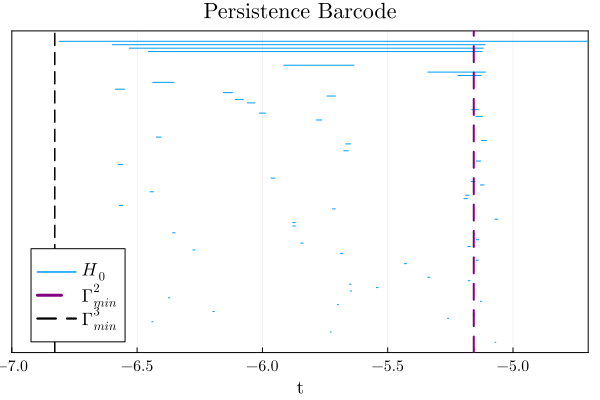

In [118]:
pBarCode_p_2 = barcode(rips_p_2[1], xlim=(-7, -4.7), lw=1, size=(600, 400), legend=:best)
Plots.vline!(pBarCode_p_2, [interpTest[1][1]], ls=:dash, color=:purple, lw=2, label = latexstring("Γ^{2}_{min}"))
Plots.vline!(pBarCode_p_2, [interpTest[2][1]], ls=:dash, color=:black, lw=1.5, label = latexstring("Γ^{3}_{min}"))
Plots.ylims!(pBarCode_p_2, (370, 464.05)) # We have to tune this ourselves. BUT IT WORKS!!
#Plots.savefig(pwd()*"/pb_N_10_p_2.pdf")

┌ Info: ylims :=
└   (1 - n_intervals * 0.05, n_intervals * 1.05) = (-199.8, 4216.8)


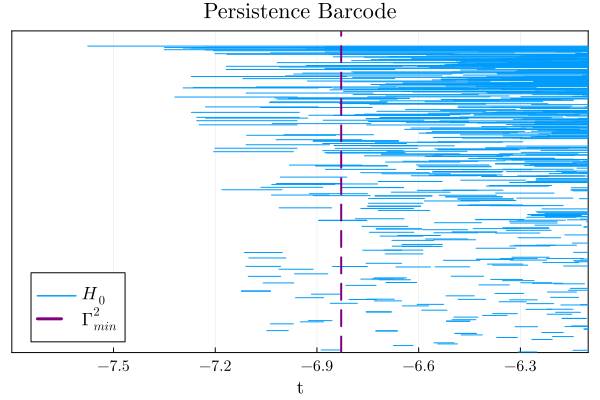

In [131]:
barcode(rips_p_3[1], xlim=(-7.8, -6.1), lw=1, size=(600, 400), legend=:bottomleft)
Plots.vline!([interpTest[2][1]], ls=:dash, color=:purple, lw=2, label = latexstring("Γ^{2}_{min}"))
#Plots.vline!([interpTest[3][1]], ls=:dash, color=:black, lw=1.5, label = latexstring("Γ^{3}_{min}"))
#Plots.savefig(pwd()*"/pb_N_10_p_3.pdf")
Plots.ylims!((2000, 4116))

In [133]:
get_ylims(rips_p_3_harv)

(-437.40000000000003, 9206.4)

┌ Info: ylims :=
└   (1 - n_intervals * 0.05, n_intervals * 1.05) = (-437.40000000000003, 9206.4)


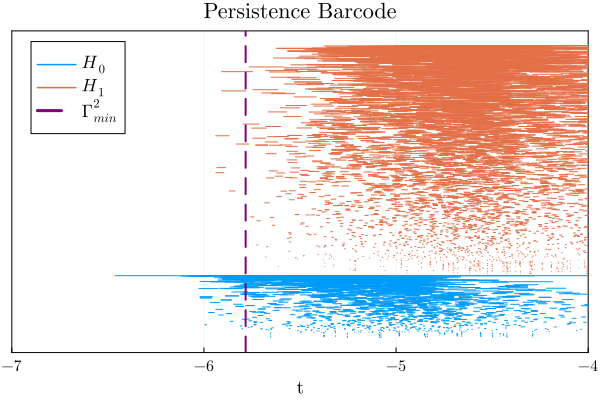

In [132]:
barcode(rips_p_3_harv, xlim=(-7, -4), lw=1, size=(600, 400), legend=:topleft)
Plots.vline!([interpTest_harv[2][1]], ls=:dash, color=:purple, lw=2, label = latexstring("Γ^{2}_{min}"))
#Plots.savefig(pwd()*"/ph_N_14_p_3.pdf")